# 130624 - Practice Monte Carlo Simulation

In [67]:
import warnings
import pandas as pd
import numpy as np
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from binance.client import Client
from scipy.stats import norm
from datetime import timedelta

In [68]:
warnings.filterwarnings('ignore')

## Fetch historical candlestick data from Binance

In [69]:
class HistData:
    def __init__(self, client=Client()):
        self.client = client

    def fetching_historical_data(self, symbol, timeframe='1d', since='1y'):
        self.frame = pd.DataFrame(self.client.get_historical_klines(symbol, timeframe, since))

        if len(self.frame) > 0:
            self.frame = self.frame.iloc[:, :6]
            self.frame.columns = ['date', 'open', 'high', 'low', 'close', 'volume']
            self.frame = self.frame.set_index('date')
            self.frame.index = pd.to_datetime(self.frame.index, unit='ms')
            self.frame = self.frame.astype(float)

        return self.frame

In [70]:
fetch_data = HistData()
btc_daily_df = fetch_data.fetching_historical_data(symbol='BTCUSDT', since='10y')

In [71]:
btc_daily_df.head()

,open,high,low,close,volume
date,,,,,
2017-08-17,4261.48,4485.39,4200.74,4285.08,795.150377
2017-08-18,4285.08,4371.52,3938.77,4108.37,1199.888264
2017-08-19,4108.37,4184.69,3850.00,4139.98,381.309763
2017-08-20,4120.98,4211.08,4032.62,4086.29,467.083022
2017-08-21,4069.13,4119.62,3911.79,4016.00,691.743060


In [72]:
btc_daily_df.tail()

,open,high,low,close,volume
date,,,,,
2024-06-12,67314.23,69999.00,66905.00,68263.99,37175.32356
2024-06-13,68263.98,68449.30,66251.78,66773.01,29079.55571
2024-06-14,66773.01,67370.24,65078.00,66043.99,28408.18797
2024-06-15,66043.99,66478.48,65857.10,66228.25,11451.80242
2024-06-16,66228.25,66770.00,66034.50,66624.00,4562.50428


## BTC/USDT Daily Closing Price

### Plotly

In [73]:
fig = px.line(btc_daily_df, x=btc_daily_df.index, y='close',
              labels={
                  'date': 'Date',
                  'close': 'Price(USDT)'
              },
              height=800,
              title='BTC/USDT Daily Closing Price')

fig.show()

### Matplotlib

Text(0.5, 1.0, 'BTC/USDT Daily Closing Price')

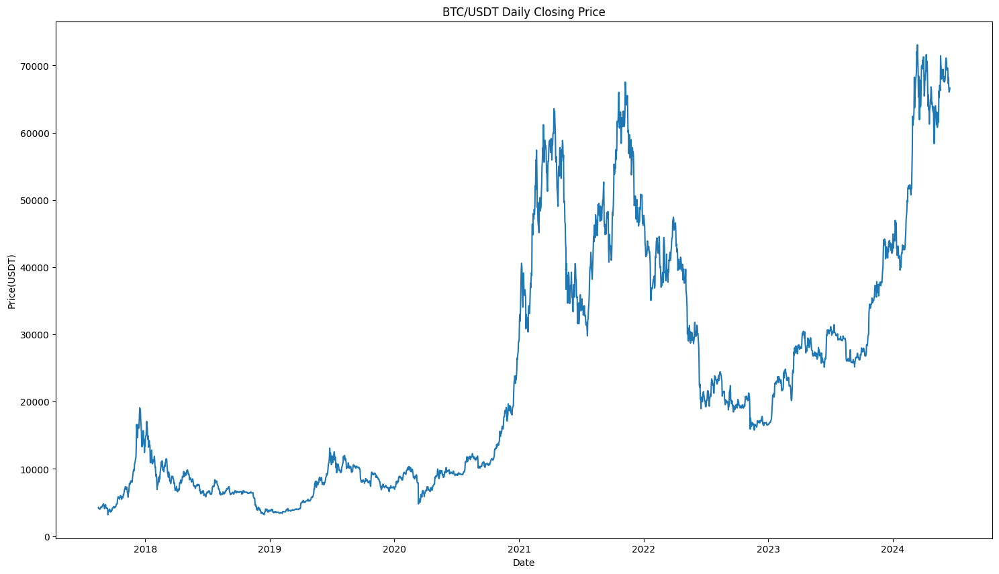

In [74]:
plt.figure(figsize=(18, 10))

plt.plot(btc_daily_df.index, btc_daily_df.close)
plt.xlabel('Date')
plt.ylabel('Price(USDT)')
plt.title('BTC/USDT Daily Closing Price')

## Calculate daily return percentage change by log return

In [75]:
btc_daily_df['log_return'] = np.log(1 + btc_daily_df['close'].pct_change())

btc_daily_df = btc_daily_df.dropna() # Drop NaN values

### Plotly

In [76]:
fig = px.histogram(btc_daily_df, x='log_return',
                   labels={
                       'log_return': 'Daily Return'
                   },
                   height=800,
                   title='Histogram of BTC/USDT Daily Return')

fig.show()

### Matplotlib

Text(0.5, 1.0, 'Histogram of BTC/USDT Daily Return')

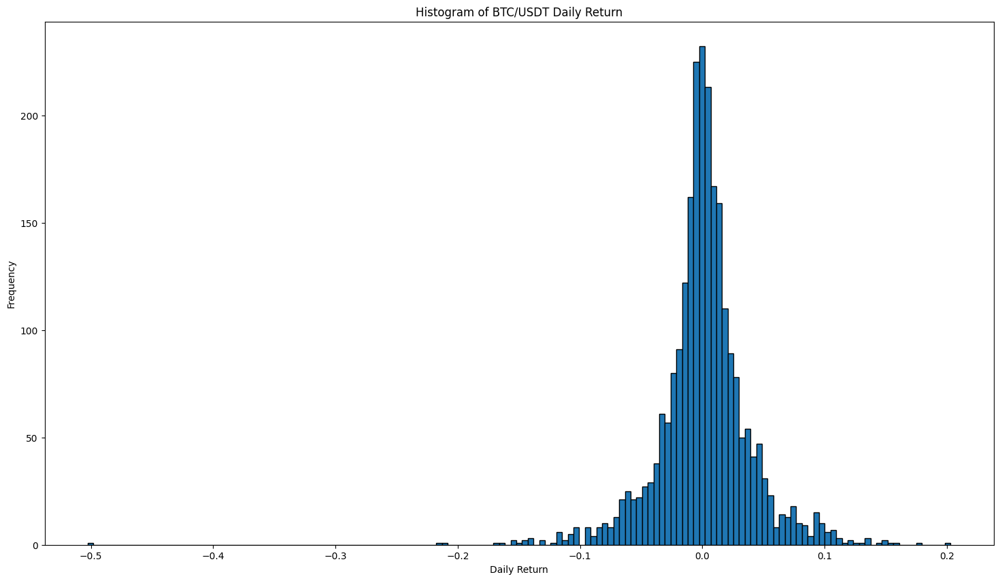

In [77]:
plt.figure(figsize=(18, 10))

plt.hist(btc_daily_df.log_return, bins='auto', edgecolor='black')
plt.xlabel('Daily Return')
plt.ylabel('Frequency')
plt.title('Histogram of BTC/USDT Daily Return')

## Monte Carlo Simulator

### Function

In [78]:
class MonteCarloSimulator:
    def __init__(self, df):
        self.df = df
    
    def generate_future_dates(self):
        future_dates = []

        since = self.df.index[-1]

        for day in range(len(self.df)):
            future_dates.append(since + timedelta(days=day))

        return future_dates

    def simulate_price_normal(self, start_price, days):
        normal_mean_return = self.df['log_return'].mean()
        normal_stdev_return = self.df['log_return'].std()

        normal_simulated_return = norm.rvs(loc=normal_mean_return, scale=normal_stdev_return, size=days)

        normal_simulated_prices = np.cumprod(1 + normal_simulated_return) * start_price

        return normal_simulated_prices
    
    '''Geometric Brownian Motion(GBM)'''
    def simulate_price_gbm(self, start_price, days):
        gbm_mean_return = self.df['log_return'].mean()
        gbm_stdev_return = self.df['log_return'].std()

        gbm_simulated_return = norm.rvs(loc=gbm_mean_return/days,
                                        scale=gbm_stdev_return/np.sqrt(days),
                                        size=days)
        
        gbm_simulated_price_change = np.exp(gbm_simulated_return) - 1
        gbm_simulated_prices = np.cumprod(1 + gbm_simulated_price_change) * start_price

        return gbm_simulated_prices

    def monte_carlo_simulation(self, num_simulations=1000, model='normal'):
        simulation_prices = []

        simulated_model = model

        start_price = self.df['close'].iloc[-1]

        if simulated_model == 'normal':
            current_model = self.simulate_price_normal
        elif simulated_model == 'gbm':
            current_model = self.simulate_price_gbm
        else:
            raise ValueError("Invalid model selection. Choose 'normal' or 'gbm'.")

        for _ in range(num_simulations):
            simulation_prices.append(current_model(start_price, len(self.df)))

        return simulation_prices

In [79]:
monte_carlo_simulator = MonteCarloSimulator(btc_daily_df)

In [80]:
normal_simulate_prices = monte_carlo_simulator.monte_carlo_simulation(num_simulations=50, model='normal')

In [81]:
gbm_simulate_prices = monte_carlo_simulator.monte_carlo_simulation(num_simulations=50, model='gbm')

In [82]:
future_generated_dates = monte_carlo_simulator.generate_future_dates()

### Graph

#### Normal Model

##### Plotly

In [83]:
traces = []

'''
historical_trace = go.Scatter(
    x=btc_daily_df.index,
    y=btc_daily_df['close'],
    name='Historical Price',
    mode='lines'
)

traces.append(historical_trace)
'''

for i, sim_price in enumerate(normal_simulate_prices, start=1):
    simulation_name = f'Simulation{i}'

    trace = go.Scatter(
        x=future_generated_dates,
        y=sim_price,
        name=simulation_name,
        mode='lines',
        opacity=0.6
    )

    traces.append(trace)

In [84]:
layout_title = f'Monte Carlo Simulation Normal Model for BTC/USDT Price ({i} Simulations)'

layout = go.Layout(
    title=layout_title,
    xaxis_title='Date',
    yaxis_title='Price(USDT)',
    height=800
)

fig = go.Figure(data=traces, layout=layout)

pio.show(fig)

##### Matplotlib

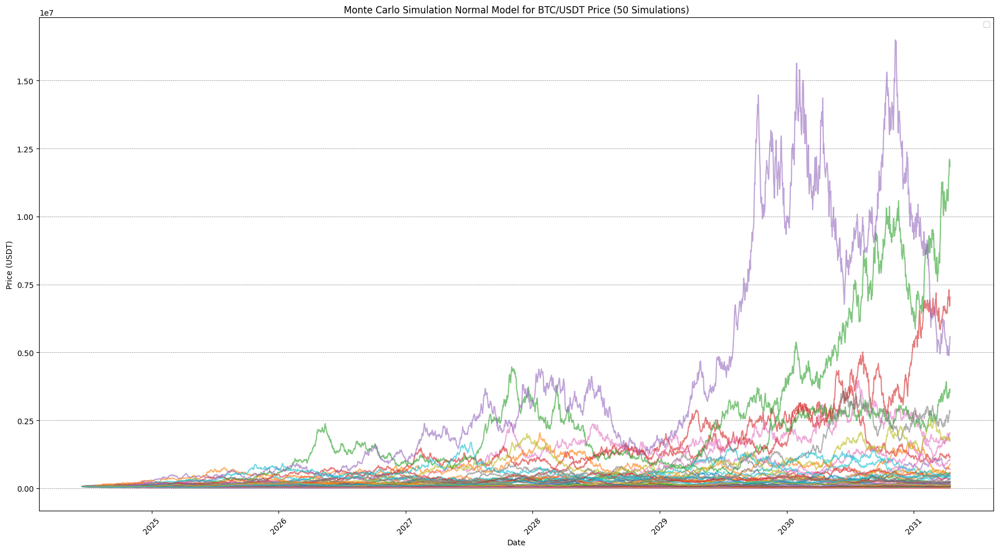

In [85]:
plt.figure(figsize=(18, 10))
# plt.plot(btc_daily_df.index, btc_daily_df['close'], label='Historical Price')

for sim_price in normal_simulate_prices:
  plt.plot(future_generated_dates, sim_price, alpha=0.6)

plt.xlabel('Date')
plt.ylabel('Price (USDT)')
plt.title(f'Monte Carlo Simulation Normal Model for BTC/USDT Price ({len(normal_simulate_prices)} Simulations)')
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', which='both', axis='y')

if len(future_generated_dates) > 30:
  plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#### GBM Model

##### Plotly

In [86]:
traces = []

for i, sim_price in enumerate(gbm_simulate_prices, start=1):
    simulation_name = f'Simulation{i}'

    trace = go.Scatter(
        x=future_generated_dates,
        y=sim_price,
        name=simulation_name,
        mode='lines',
        opacity=0.6
    )

    traces.append(trace)

In [87]:
layout_title = f'Monte Carlo Simulation GBM Model for BTC/USDT Price ({i} Simulations)'

layout = go.Layout(
    title=layout_title,
    xaxis_title='Date',
    yaxis_title='Price(USDT)',
    height=800
)

fig = go.Figure(data=traces, layout=layout)

pio.show(fig)

##### Matplotlib

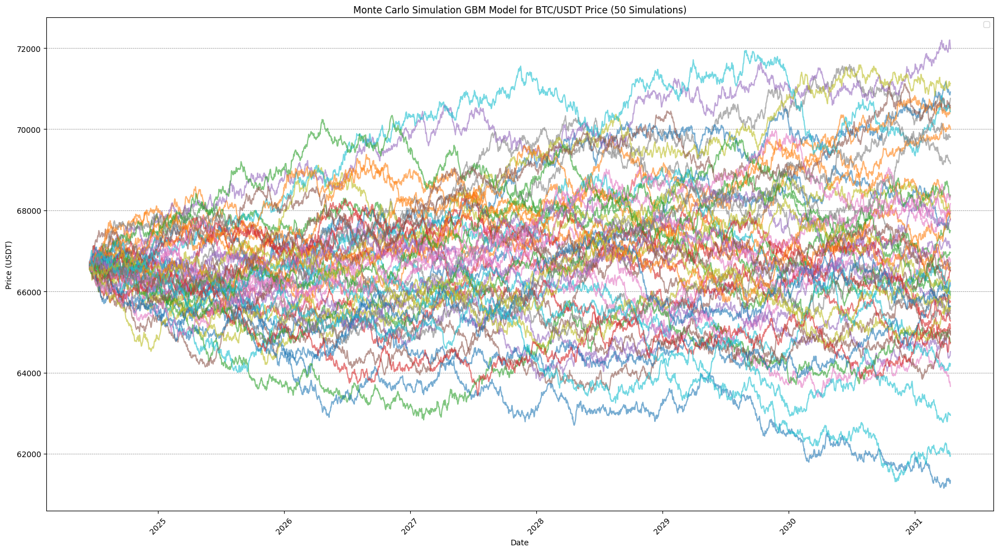

In [88]:
plt.figure(figsize=(18, 10))

for sim_price in gbm_simulate_prices:
  plt.plot(future_generated_dates, sim_price, alpha=0.6)

plt.xlabel('Date')
plt.ylabel('Price (USDT)')
plt.title(f'Monte Carlo Simulation GBM Model for BTC/USDT Price ({len(gbm_simulate_prices)} Simulations)')
plt.legend()
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', which='both', axis='y')

if len(future_generated_dates) > 30:
  plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#### Summary

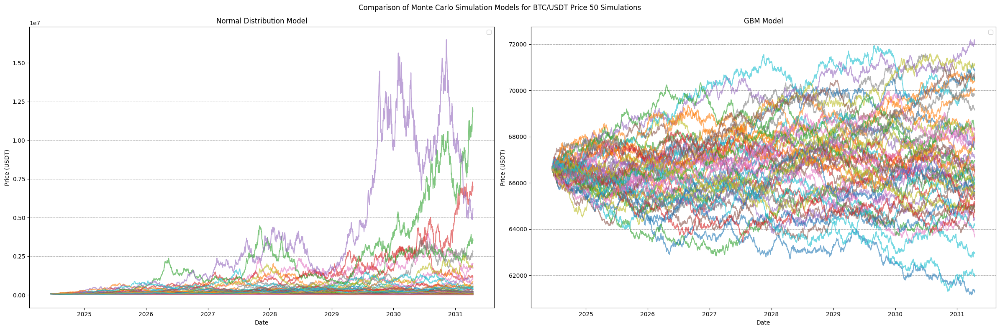

In [89]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,8))

for normal_simu_price in normal_simulate_prices:
  ax1.plot(future_generated_dates, normal_simu_price, alpha=.6)

ax1.set_xlabel('Date')
ax1.set_ylabel('Price (USDT)')
ax1.set_title('Normal Distribution Model')
ax1.legend()
ax1.grid(True, linestyle='--', linewidth=0.5, color='gray', which='both', axis='y')

for gbm_simu_price in gbm_simulate_prices:
  ax2.plot(future_generated_dates, gbm_simu_price, alpha=.6)

ax2.set_xlabel('Date')
ax2.set_ylabel('Price (USDT)')
ax2.set_title('GBM Model')
ax2.legend()
ax2.grid(True, linestyle='--', linewidth=0.5, color='gray', which='both', axis='y')

fig.suptitle(f'Comparison of Monte Carlo Simulation Models for BTC/USDT Price {len(normal_simulate_prices)} Simulations')
plt.tight_layout()
plt.show()